In [2]:
import stim
import pymatching
import numpy as np
import sinter
from typing import List
import matplotlib.pyplot as plt

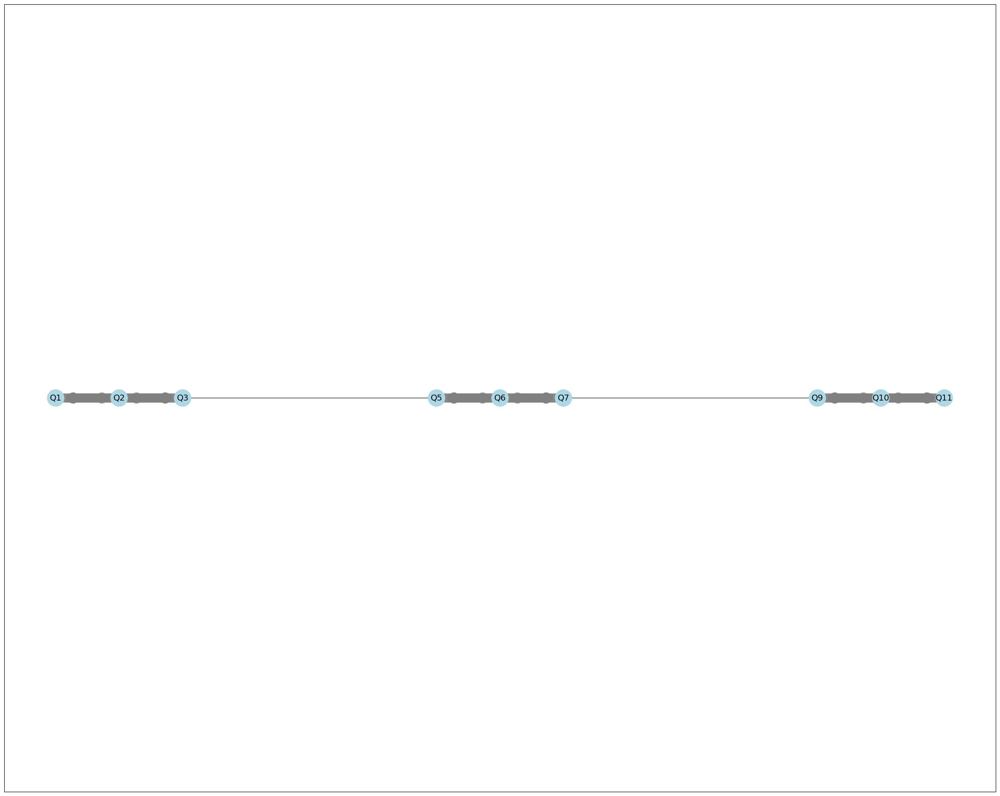

In [3]:
from src.utils.qccd_arch import *

# Create architecture
arch = QCCDArch()

ionspacing = 5
trapspacing = 30
cooling_colour = 'red'
qubit_colour = 'lightblue'
traps = []

for i in range(3):
    ions = [QubitIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q')]
    trap = arch.addManipulationTrap(x=i *trapspacing, y=0, ions=ions, color='grey', spacing=ionspacing, isHorizontal=True)
    traps.append(trap)

for t1, t2 in zip(traps[:-1], traps[1:]):
    arch.addEdge(t1, t2)

arch.refreshGraph()
fig, ax = plt.subplots()
# Display architecture
arch.display(fig,ax, showLabels=False)





In [10]:
from src.utils.qccd_arch import *
from src.compiler.qccd_parallelisation import *

# Create architecture
arch = QCCDArch()

ionspacing = 1
trapspacing = 6
qubit_colour = 'red'
qubit_colour = 'lightblue'
junction_colour = 'orange'
traps = []

ManipulationTrap.DEFAULT_SPACING = trapspacing
arch.SIZING = 0.5
ions11 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap11 = arch.addManipulationTrap(x=0, y=0, ions=ions11, color='grey', spacing=ionspacing, isHorizontal=False)

ions12 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap12 = arch.addManipulationTrap(x=trapspacing, y=0, ions=ions12, color='grey', spacing=ionspacing, isHorizontal=False)

junctionL = arch.addJunction(x=0, y=trapspacing, color=junction_colour)
junctionR = arch.addJunction(x=trapspacing, y=trapspacing, color=junction_colour)

ions21 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap21 = arch.addManipulationTrap(x=0, y=2*trapspacing, ions=ions21, color='grey', spacing=ionspacing, isHorizontal=False)

ions22 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap22 = arch.addManipulationTrap(x=trapspacing, y=2*trapspacing, ions=ions22, color='grey', spacing=ionspacing, isHorizontal=False)

crossing11 = arch.addEdge(trap11, junctionL)
arch.addEdge(trap12, junctionR)
crossing21 = arch.addEdge(trap21, junctionL)
arch.addEdge(trap22, junctionR)
arch.addEdge(junctionL, junctionR)

arch.refreshGraph()
# Display architecture


ops = (
    Split.physicalOperation(trap11, crossing11), 
    Move.physicalOperation(crossing11),
    JunctionCrossing.physicalOperation(junctionL, crossing11),
    JunctionCrossing.physicalOperation(junctionL, crossing21),
    Move.physicalOperation(crossing21),
    Merge.physicalOperation(trap21, crossing21),
    GateSwap.physicalOperation(trap=trap21, ion1=ions21[0], ion2=ions21[2]),
    TwoQubitMSGate.physicalOperation(ion1=ions22[0], ion2=ions22[2],trap=trap22),
    OneQubitGate.physicalOperation(ion=ions12[0], trap=trap12),
    Measurement.physicalOperation(ion=ions12[0], trap=trap12),
    QubitReset.physicalOperation(ion=ions12[0],trap=trap12))
parallelOps = paralleliseOperationsSimple(ops)





QUBIT_RESET[24]
QUBIT_RESET[15]
QUBIT_RESET[28]
QUBIT_RESET[17]
QUBIT_RESET[35]
QUBIT_RESET[38]
QUBIT_RESET[41]
QUBIT_RESET[54]
QUBIT_RESET[47]
QUBIT_RESET[63]
QUBIT_RESET[50]
QUBIT_RESET[51]
QUBIT_RESET[59]
QUBIT_RESET[60]
QUBIT_RESET[66]
QUBIT_RESET[67]
QUBIT_RESET[22]
QUBIT_RESET[26]
QUBIT_RESET[23]
QUBIT_RESET[14]
QUBIT_RESET[27]
QUBIT_RESET[33]
QUBIT_RESET[34]
QUBIT_RESET[37]
QUBIT_RESET[40]
QUBIT_RESET[53]
QUBIT_RESET[46]
QUBIT_RESET[62]
QUBIT_RESET[49]
QUBIT_RESET[58]
QUBIT_RESET[65]
RY[22]
RX[22]
RY[26]
RX[26]
RY[14]
RX[14]
RY[34]
RX[34]
RY[40]
RX[40]
RY[62]
RX[62]
RY[58]
RX[58]
RY[65]
RX[65]
RY[22]
RX[22]
RX[15]
TWO_QUBIT_MS_GATE[22, 15]
RY[22]
RY[34]
RX[34]
RX[63]
TWO_QUBIT_MS_GATE[34, 63]
RY[34]
RY[14]
RX[14]
RX[41]
TWO_QUBIT_MS_GATE[14, 41]
RY[14]
RY[62]
RX[62]
RX[66]
TWO_QUBIT_MS_GATE[62, 66]
RY[62]
RY[26]
RX[26]
RX[17]
TWO_QUBIT_MS_GATE[26, 17]
RY[26]
RY[40]
RX[40]
RX[51]
TWO_QUBIT_MS_GATE[40, 51]
RY[40]
RY[47]
RX[47]
RX[33]
TWO_QUBIT_MS_GATE[47, 33]
RY[47]
RY[38]
RX[38]


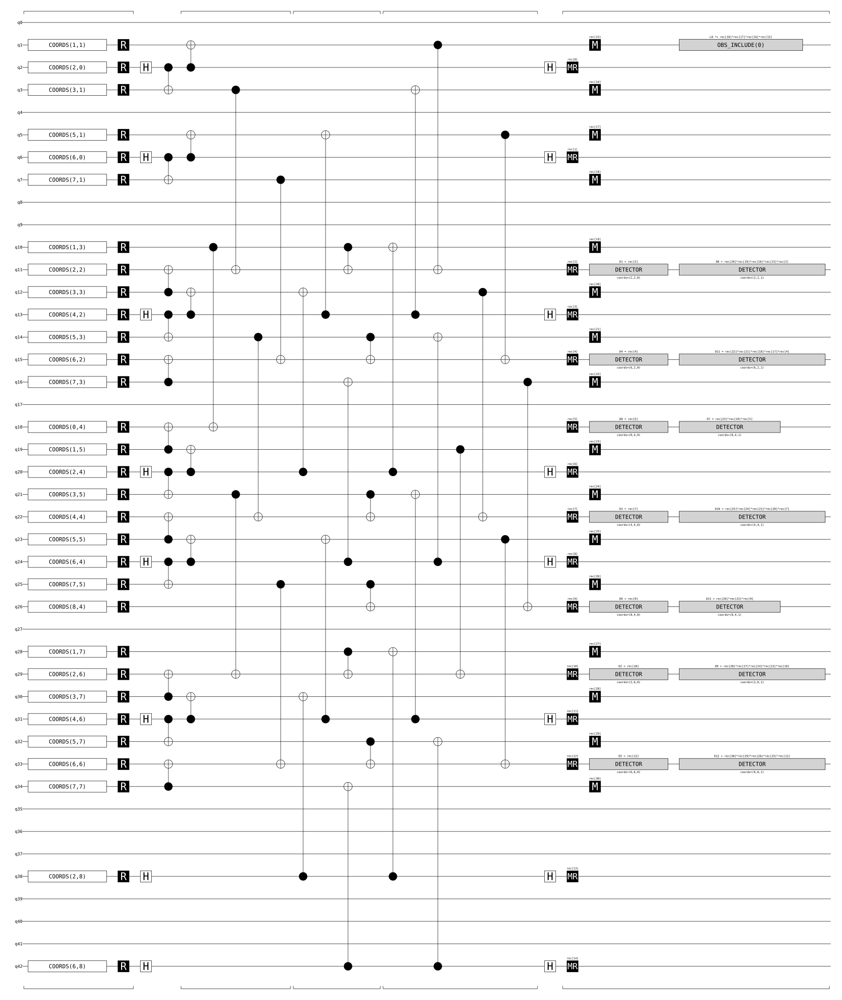

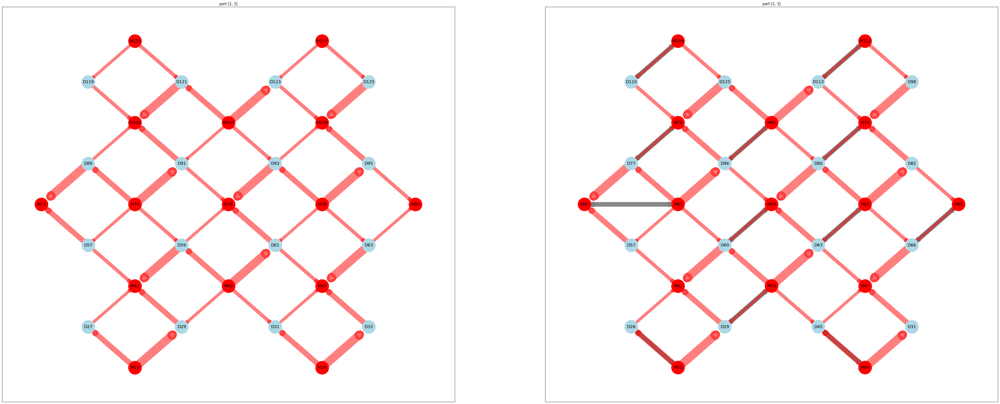

In [16]:
from src.simulator.qccd_circuit import *

noise = 1e-3
d=4
    
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=d,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)


rows = 4
cols = 4
capacity = 4

arch, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=capacity)

for i in instructions:
    print(i.label+str([ion.idx for ion in i.ions]))

_capacities = [2,3]
rows = 10
cols = 10

label='part'
fig, axs = plt.subplots(1, len(_capacities))
for ax, capacity in zip(axs, _capacities):
    arch1, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=capacity)
    arch1.ION_SIZE = 2000

    for idx, (ion, pos) in circuit._ionMapping.items():
        ion.set(ion.idx, pos[0], pos[1])

    arch1.refreshGraph()
    edgesDups = []
    edgesPos = []
    ionsInvolved = set()
    score = 0
    for op in instructions:
        if not isinstance(op, TwoQubitMSGate):
            continue
        if not ionsInvolved.isdisjoint(op.ions):
            score+=1
            ionsInvolved=set()
        edgesDups.append((op.ions, score))
        edgesPos.append((op.ionsActedIdxs, score))
        ionsInvolved=ionsInvolved.union(op.ions)
    scores = [score for ((ion1,ion2), score) in edgesDups]
    color_from_score = {s: (5+i*i)*2 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
    arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
    arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
    ax.set_title(f"{label} {_capacities}")


circuit.without_noise().diagram('timeline-svg')

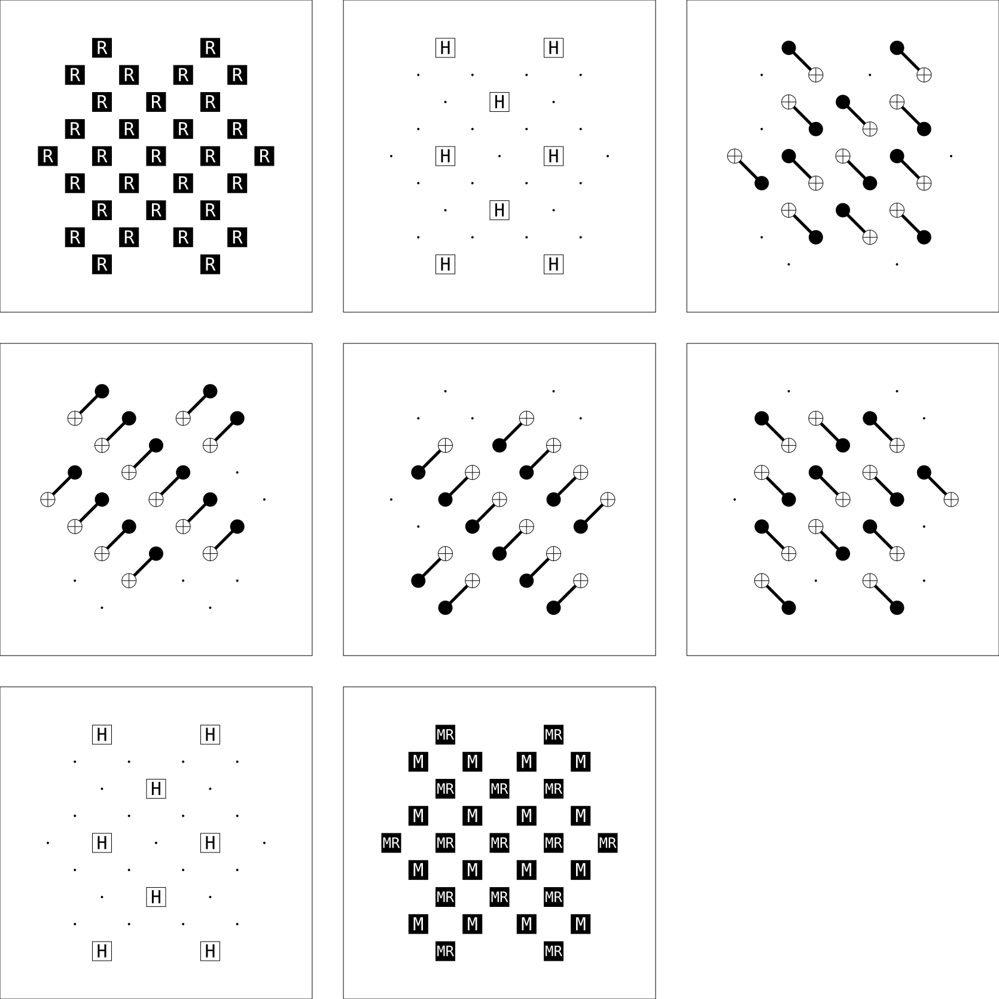

In [17]:
from src.simulator.qccd_circuit import *

noise=0.01
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=4,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeslice-svg')

total number of qubit operations: 349
total number of operations: 1213
time for operations: 0.005325


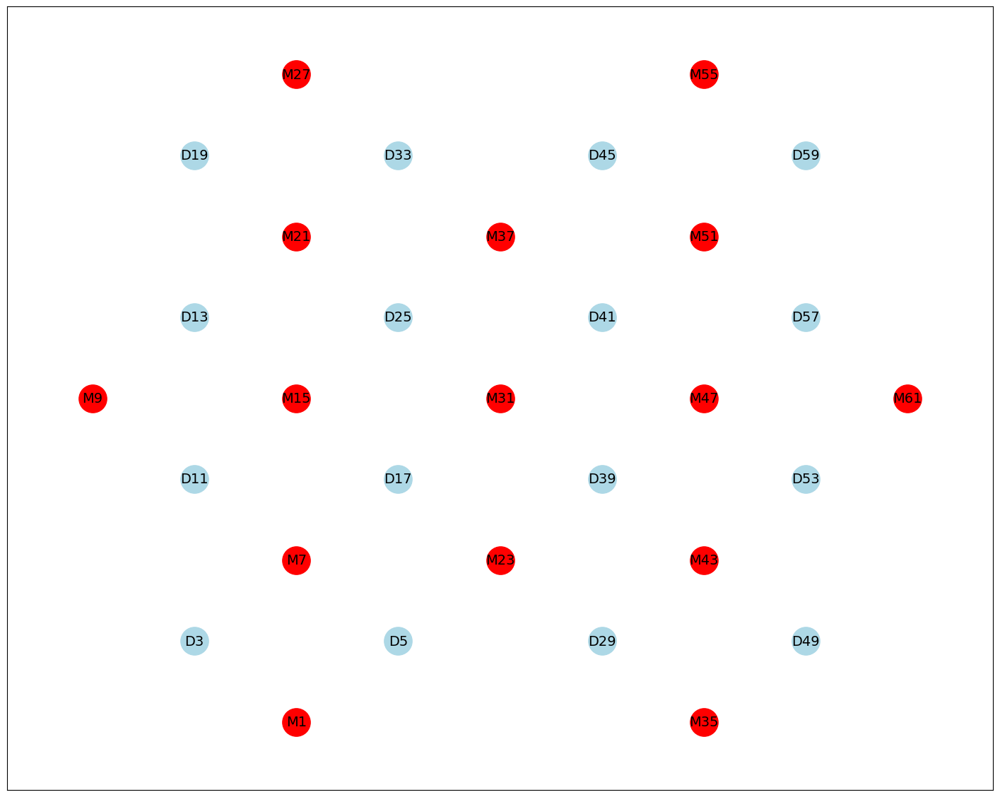

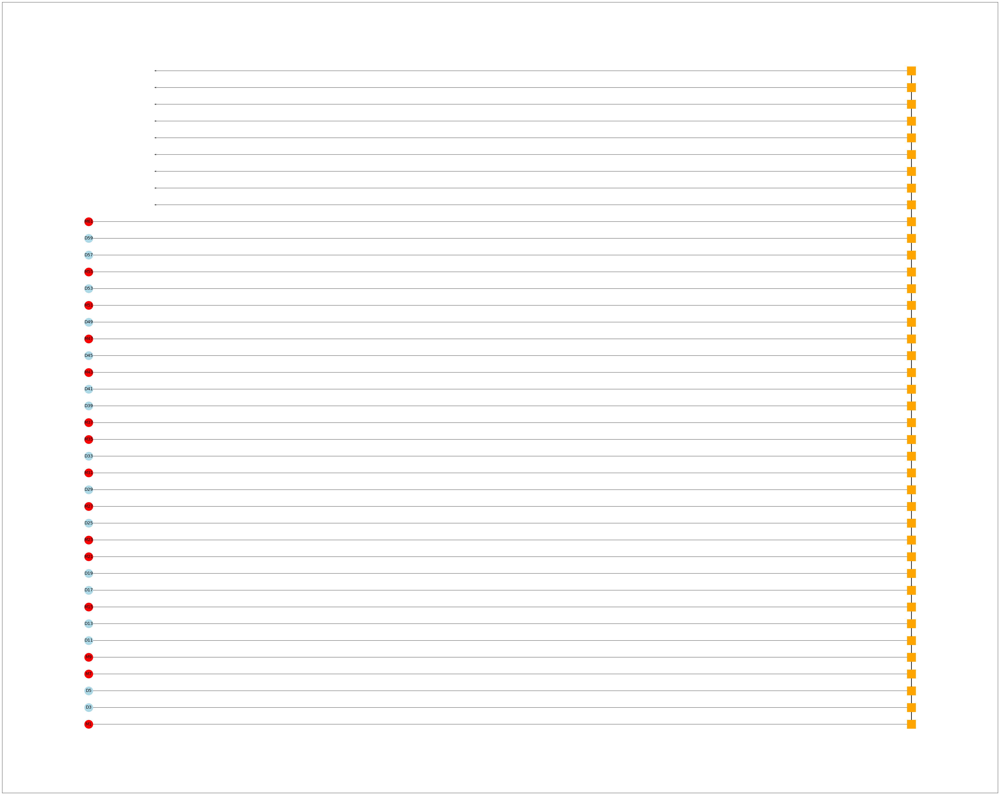

In [20]:
from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *

trapCapacity=2
noise=0.01
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=4,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
arch, (instructions,_) = circuit.processCircuitNetworkedGrid(traps=40, trapCapacity=trapCapacity)

oldPositions = {}
for idx, (ion, pos) in circuit._ionMapping.items():
    oldPositions[idx] = ion.pos
    ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

fig,ax =plt.subplots()
arch1 = arch
arch1.refreshGraph()
edgesDups = []
edgesPos = []
ionsInvolved = set()
score = 0
for op in instructions:
    if not isinstance(op, TwoQubitMSGate):
        continue
    if not ionsInvolved.isdisjoint(op.ions):
        score+=1
        ionsInvolved=set()
    edgesDups.append((op.ions, score))
    edgesPos.append((op.ionsActedIdxs, score))
    ionsInvolved=ionsInvolved.union(op.ions)
scores = [score for ((ion1,ion2), score) in edgesDups]
color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*0.6, arch.WINDOW_SIZE[1]*0.6)
arch1._manipulationTraps = arch1._manipulationTraps[:-1]
for idx, (ion, pos) in circuit._ionMapping.items():
    ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)


arch.refreshGraph()

fig,ax =plt.subplots()
arch.display(fig, ax, showLabels=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*2, arch.WINDOW_SIZE[1]*2)

allOps, barriers = ionRouting(arch, instructions, trapCapacity=trapCapacity)
parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
parallelOps = list(dict(parallelOpsMap).values())


print(f"total number of qubit operations: {len(instructions)}")
print(f"total number of operations: {len(allOps)}")
print(f"time for operations: {max(parallelOpsMap.keys())}")

total number of qubit operations: 1178
total number of operations: 3194
time for operations: 0.004505


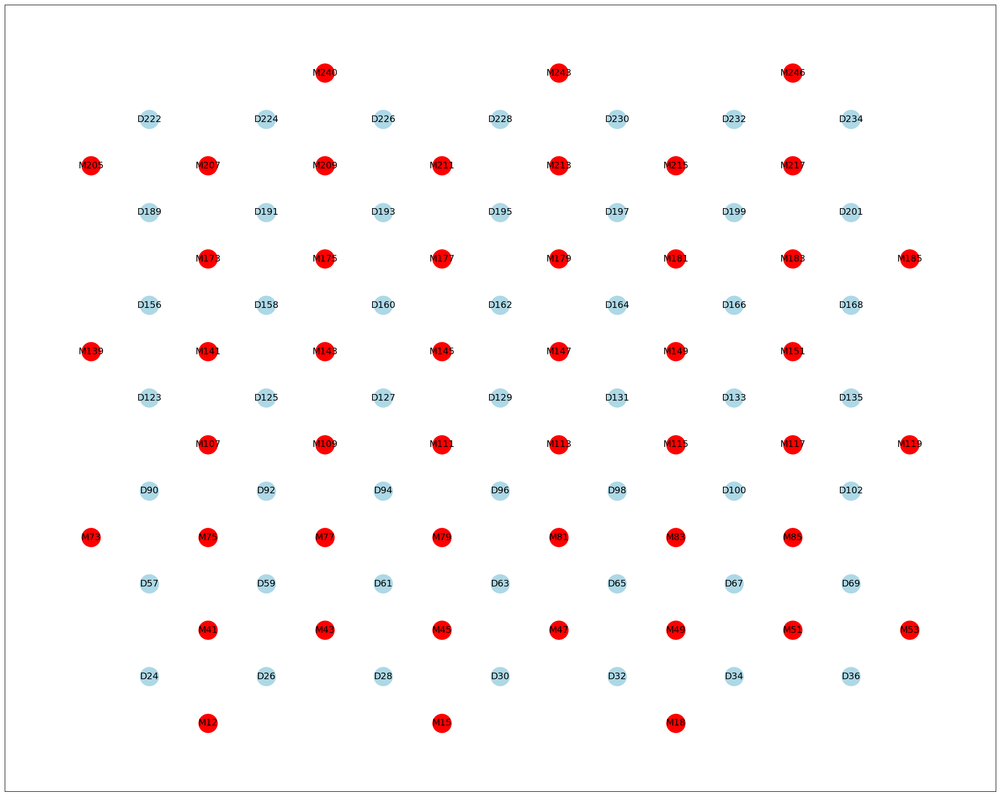

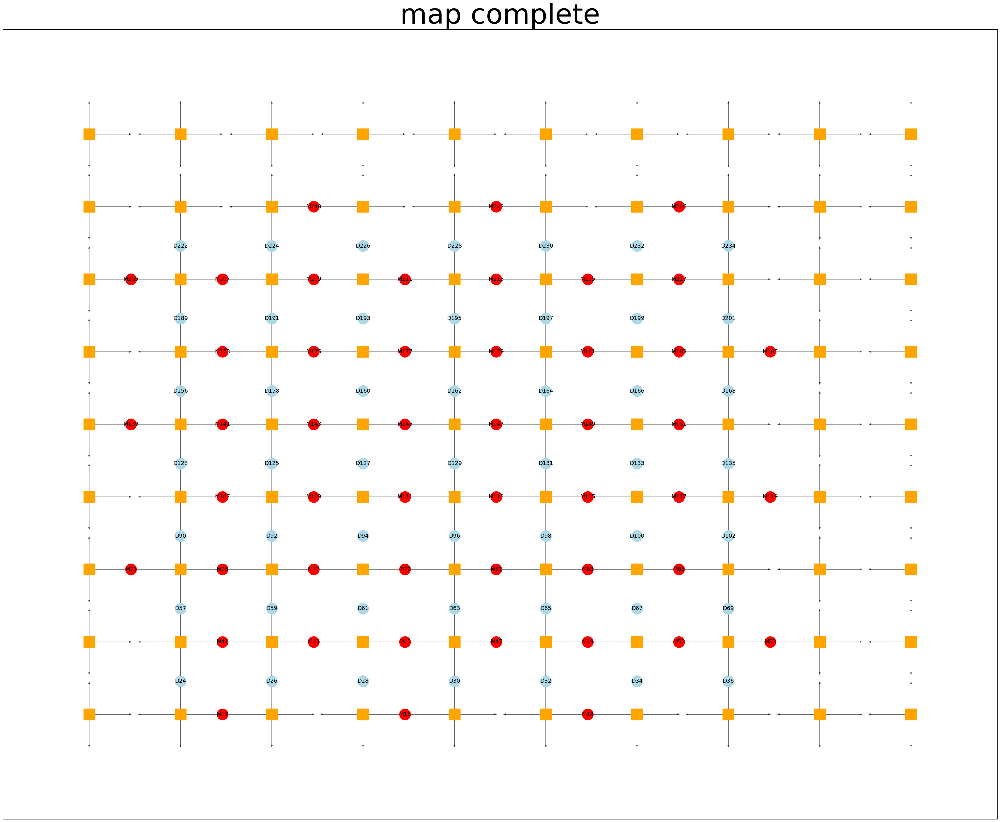

In [3]:
from src.compiler.qccd_ion_routing import *
from src.simulator.qccd_circuit import *
d = 7
# safe to have either barriers or go back
barrierThreshold = np.inf
goBackThreshold = 0
for trapCapacity in [2]:
    noise=0.01
    circuit = QCCDCircuit.generated(
        "surface_code:rotated_memory_z",
        rounds=1,
        distance=d,
        after_clifford_depolarization=noise,
        after_reset_flip_probability=noise,
        before_measure_flip_probability=noise,
        before_round_data_depolarization=noise,
    )
    arch, (instructions, opBarriers) = circuit.processCircuitAugmentedGrid(rows=d+1, cols=d+1, trapCapacity=trapCapacity, padding=(trapCapacity==2))

    oldPositions = {}
    for idx, (ion, pos) in circuit._ionMapping.items():
        oldPositions[idx] = ion.pos
        ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

    fig,ax =plt.subplots()
    arch1 = arch
    arch1.refreshGraph()
    edgesDups = []
    edgesPos = []
    ionsInvolved = set()
    score = 0
    for op in instructions:
        if not isinstance(op, TwoQubitMSGate):
            continue
        if not ionsInvolved.isdisjoint(op.ions):
            score+=1
            ionsInvolved=set()
        edgesDups.append((op.ions, score))
        edgesPos.append((op.ionsActedIdxs, score))
        ionsInvolved=ionsInvolved.union(op.ions)
    scores = [score for ((ion1,ion2), score) in edgesDups]
    color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
    arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
    arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
    fig.set_size_inches(arch.WINDOW_SIZE[0]*0.9, arch.WINDOW_SIZE[1]*0.9)
    arch1._manipulationTraps = arch1._manipulationTraps[:-1]
    for idx, (ion, pos) in circuit._ionMapping.items():
        ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)

    arch.refreshGraph()

    fig,ax =plt.subplots()
    arch.display(fig, ax, title='map complete', showLabels=False)
    fig.set_size_inches(arch.WINDOW_SIZE[0]*1.5, arch.WINDOW_SIZE[1]*1.5)

    opBarriers = opBarriers if trapCapacity<=barrierThreshold else []
    allOps, barriers = ionRouting(arch, instructions, trapCapacity)
    parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
    parallelOps = list(dict(parallelOpsMap).values())

    circuit.simulate(allOps)

    arch = circuit.resetArch()
    arch.refreshGraph()


    print(f"total number of qubit operations: {len(instructions)}")
    print(f"total number of operations: {len(allOps)}")
    print(f"time for operations: {max(parallelOpsMap.keys())}")


In [ ]:
print(len(paralleliseOperationsSimple(allOps)))

In [ ]:
parallelOps = paralleliseOperationsSimple(allOps)
arch = circuit.resetArch()
arch.refreshGraph()


axsPerFig = 2
figs = []
axs = []
numFigs = int(len(parallelOps)/(axsPerFig))+int((len(parallelOps)%(axsPerFig))>0)
for _ in range(numFigs):
    fig, axs_ = plt.subplots(1, axsPerFig, sharex=False, sharey=False)
    figs.extend([fig]*axsPerFig)
    axs.extend(axs_)

figs = figs[:len(parallelOps)]
axs = axs[:len(parallelOps)]

for fig, ax, parallelOp in zip(figs, axs, parallelOps):
    arch.display(fig, ax, operation=parallelOp, runOps=True, showLabels=False)
  

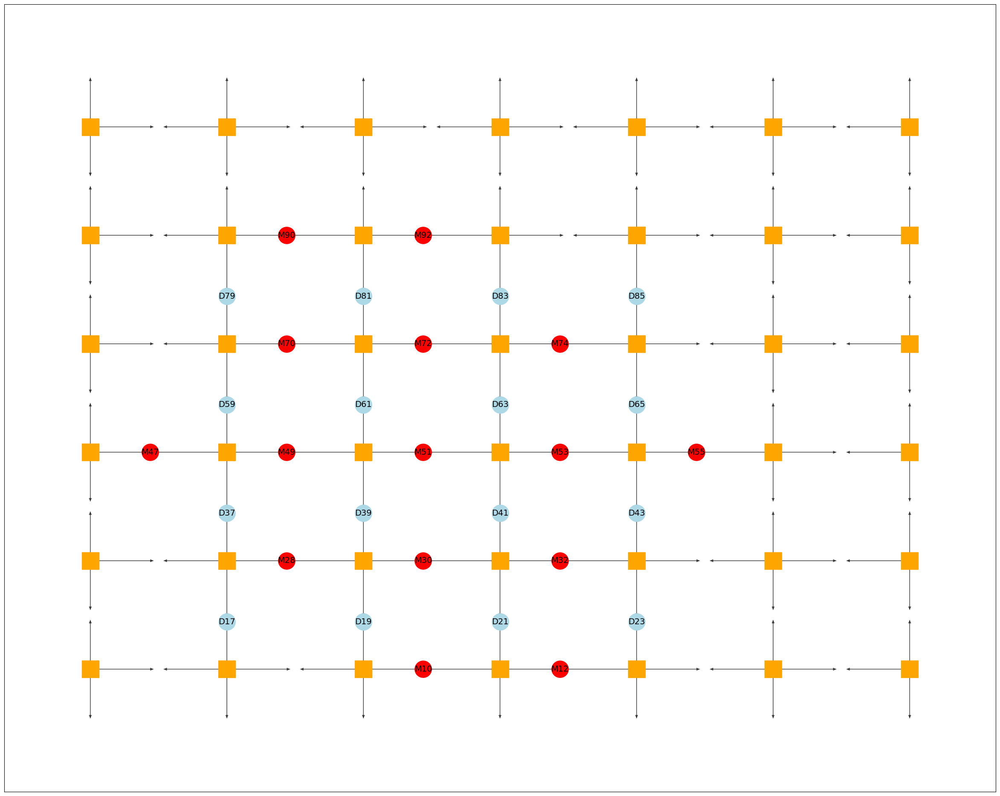

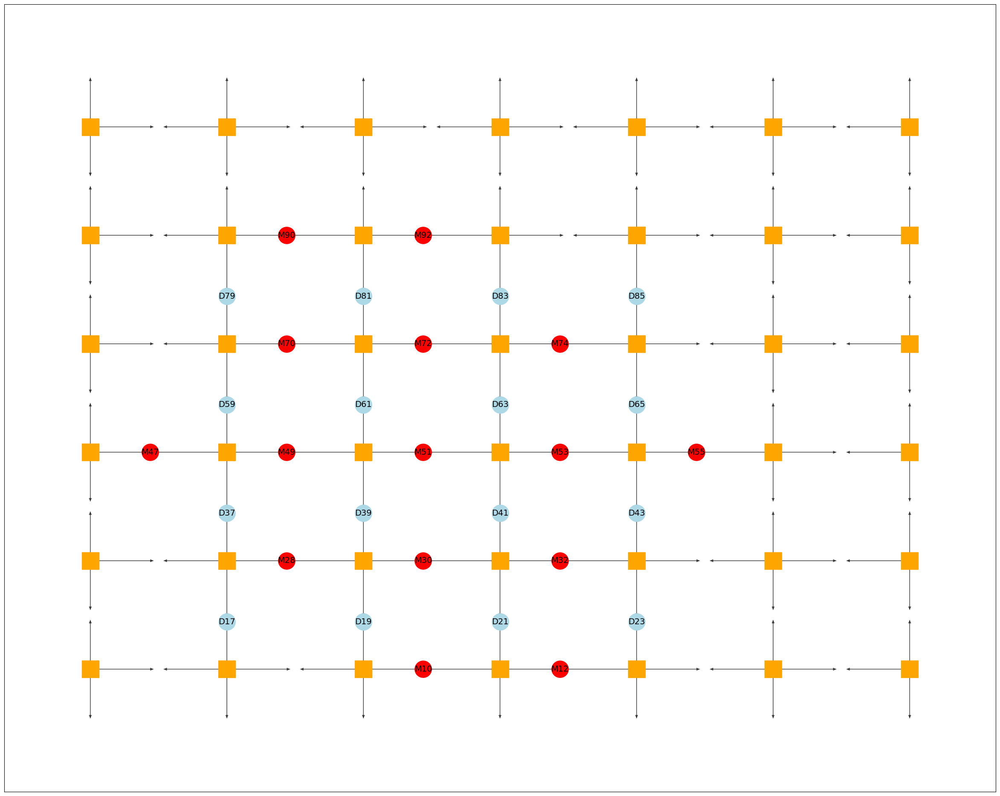

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
from IPython.display import HTML, clear_output, display

arch = circuit.resetArch()
arch.refreshGraph()
fig,ax=plt.subplots()

parallelOpsSimple = paralleliseOperationsSimple(allOps)
def update(frame, _arch):
    ax.clear()
    # Clear the output for dynamic display in Jupyter notebook
    clear_output(wait=True)
    if frame>0:
        op: ParallelOperation = parallelOpsSimple[frame-1]
        title = f"Operation: {op.label}"
        _arch.display(fig, ax, title, operation=op, runOps=True, showLabels=False)
    else:
        _arch.display(fig, ax, showLabels=False)
    return display(fig)
import time
time.sleep(10)
ani = FuncAnimation(fig, lambda frame: update(frame, arch), frames=len(parallelOpsSimple)+1, repeat=False)
HTML(ani.to_jshtml())

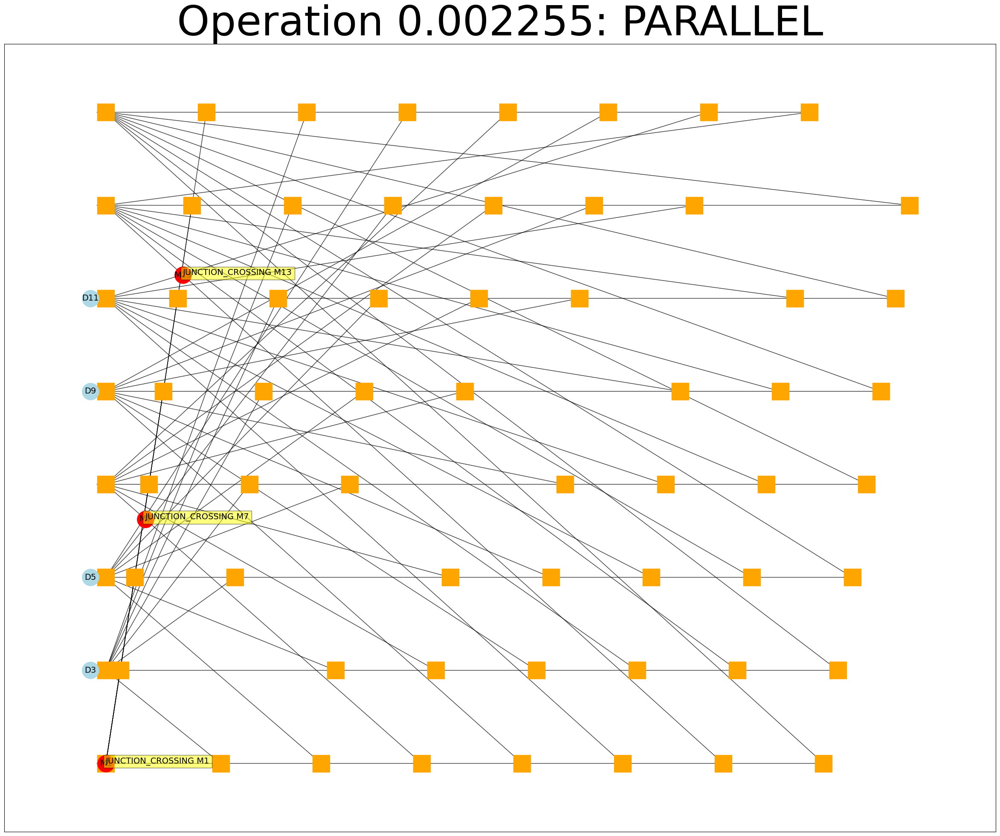

KeyboardInterrupt: 

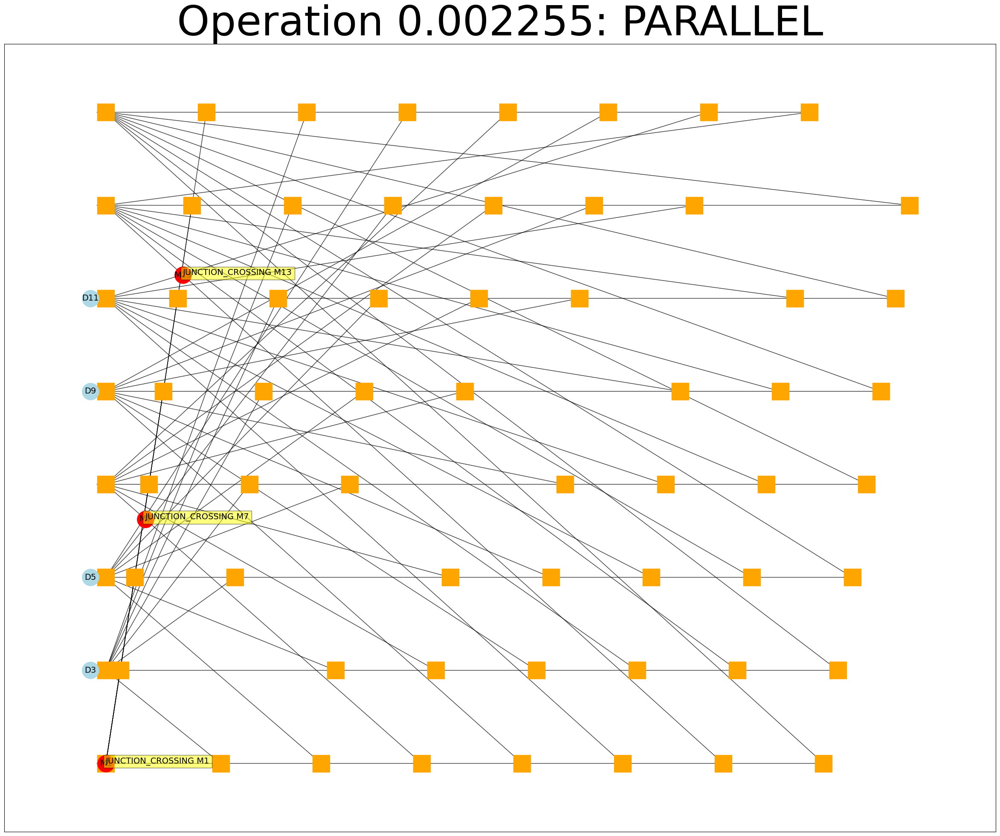

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
from IPython.display import HTML, clear_output, display

arch = circuit.resetArch()
arch.refreshGraph()
fig,ax=plt.subplots()
parallelOpsTimes = sorted(parallelOpsMap.keys())


def update(frame, _arch):
    ax.clear()
    # Clear the output for dynamic display in Jupyter notebook
    clear_output(wait=True)
    if frame>0:
        op: ParallelOperation = parallelOps[frame-1]
        title = f"Operation {round(parallelOpsTimes[frame-1],6)}: {op.label}"
        _arch.display(fig, ax, title, operation=op, runOps=True, showLabels=False)
    else:
        _arch.display(fig, ax, showLabels=False)
    return display(fig)
import time
# time.sleep(10)
ani = FuncAnimation(fig, lambda frame: update(frame, arch), frames=len(parallelOps)+1, repeat=False)
HTML(ani.to_jshtml())

In [4]:

# gate improvement that is expected in the next few years is about 10X or maximum 100X, not more than that
gate_improvements = [0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]
distances = [2,3,4,5,6,7,8,9,10,11,12]
# capacities refer to maximum number of qubits we place in a single trap for the initial QCCD configuration
# true maximum trap capacity, i.e. the maximum number of ions each trap can hold in any instance, is 5 times this initial configuration maximum value 
capacities = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,30,60,120]

# FIXME legacy formatting no longer need the forwarding/routing requirements
data = {k: {"Forwarding": {d: {c: None for c in capacities} for d in distances}, "Routing": {d: {c: None for c in capacities} for d in distances}} for k in ("PhysicalZErrorRates", "PhysicalXErrorRates","Operations", "ElapsedTime", "MeanConcurrency", "QubitOperations", "LogicalErrorRates")}


In [5]:
for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            print(k1, k2, k3, data[k1][k2][k3])

PhysicalZErrorRates Forwarding 2 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 3 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 4 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 5 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 6 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorR

In [ ]:
data = ...

In [11]:
with open('saved_Data_linear.txt', 'w') as f:
    f.write(str(data))

In [3]:
from src.simulator.qccd_circuit import *
process_circuit(4,2,gate_improvements,100_000)

{'ElapsedTime': {'Forwarding': 0.005325},
 'Operations': {'Forwarding': 1213},
 'MeanConcurrency': {'Forwarding': 13.524271844660195},
 'QubitOperations': {'Forwarding': 349},
 'LogicalErrorRates': {'Forwarding': [0.49966,
   0.49815,
   0.48416,
   0.27039,
   0.10417,
   0.03043,
   0.00128,
   0.0003,
   0.00027,
   0.00015,
   9e-05,
   2e-05,
   3e-05,
   3e-05,
   0.0]},
 'PhysicalZErrorRates': {'Forwarding': [0.30511978038651094,
   0.15261753138375825,
   0.07630876569187912,
   0.030523506276751655,
   0.015261753138375828,
   0.007630876569187914,
   0.0015261753138375831,
   0.0007630876569187916,
   0.0006104701255350327,
   0.0005087251046125275,
   0.0003815438284593958,
   0.00030523506276751634,
   0.00021802504483394033,
   0.00015261753138375817,
   7.630876569187908e-05]},
 'PhysicalXErrorRates': {'Forwarding': [0.2698489086937891,
   0.13496656103215543,
   0.06748328051607771,
   0.02699331220643108,
   0.01349665610321554,
   0.00674832805160777,
   0.001349665610

In [10]:
from src.simulator.qccd_circuit import *

num_shots = 1_000_000
data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


import concurrent.futures
import logging

import os

num_cores = os.cpu_count()
num_processes = num_cores 

logger = logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.FileHandler("process_log.txt")
formatter = logging.Formatter('%(processName)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)

with concurrent.futures.ProcessPoolExecutor(max_workers=num_processes) as executor:
    futures = []
    for d in distances:
        for c in capacities:
            logger.info(f"Submitting task for distance {d} and capacity {c}.")
            futures.append(executor.submit(process_circuit, d, c, gate_improvements, num_shots))

    for future in concurrent.futures.as_completed(futures):
        if future.exception() is not None:
            logger.error(f"Exception Occured for future", exc_info=future.exception())
            continue

        try:
            result = future.result()

            d = result["Distance"]
            c = result["Capacity"]
            for label in result["ElapsedTime"]:
                data["ElapsedTime"][label][d][c] = result["ElapsedTime"][label]
                data["Operations"][label][d][c] = result["Operations"][label]
                data["MeanConcurrency"][label][d][c] = result["MeanConcurrency"][label]
                data["QubitOperations"][label][d][c] = result["QubitOperations"][label]
                data["LogicalErrorRates"][label][d][c] = result["LogicalErrorRates"][label]
                data["PhysicalXErrorRates"][label][d][c] = result["PhysicalXErrorRates"][label]
                data["PhysicalZErrorRates"][label][d][c] = result["PhysicalZErrorRates"][label]

            
            logger.info(f"Processing result for distance {result['Distance']}, capacity {result['Capacity']}.")
        except Exception as e:
            logger.error(f"Exception Occured for future", exc_info=True)
            continue

        

In [5]:


for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            data[k1][k2][k3] = [data[k1][k2][k3][c] for c in _capacities]


data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


In [74]:
gate_improvements = [0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]
distances = [2,3,4,5,6,7] #,8,9,10,11,12]
# capacities refer to maximum number of qubits we place in a single trap for the initial QCCD configuration
# true maximum trap capacity, i.e. the maximum number of ions each trap can hold in any instance, is 5 times this initial configuration maximum value 
capacities = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,30,60,120]


In [71]:
linear_data = ...

In [72]:
grid_data = ...

In [73]:
switch_data = ...

In [6]:
import matplotlib as mpl
import matplotlib.colors as mplcolors


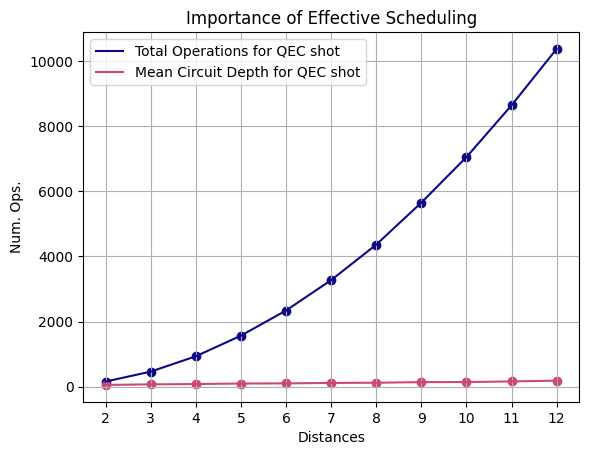

In [7]:

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 3))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(distances, [data["Operations"][label][d][0] for d in distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Total Operations for QEC shot")
ax1.plot(distances, [int(data["Operations"][label][d][0]/data["MeanConcurrency"][label][d][0]) for d in distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Mean Circuit Depth for QEC shot")
ax1.scatter(distances, [data["Operations"][label][d][0] for d in distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.scatter(distances, [int(data["Operations"][label][d][0]/data["MeanConcurrency"][label][d][0]) for d in distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Importance of Effective Scheduling')
ax1.set_xticks(distances)
ax1.set_xlabel('Distances')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')


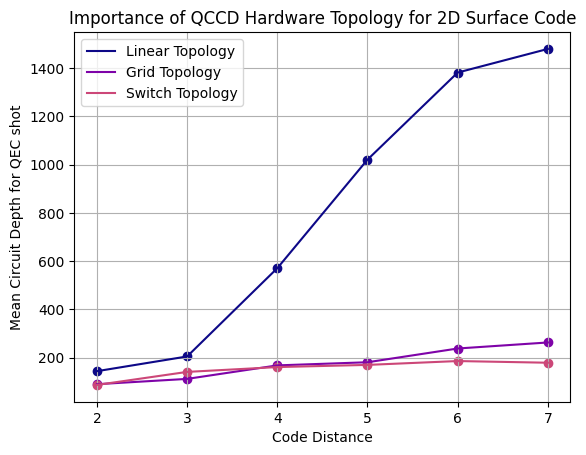

In [85]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(distances, [int(linear_data["Operations"][label][d][3]/linear_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(distances, [int(linear_data["Operations"][label][d][3]/linear_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(distances, [int(grid_data["Operations"][label][d][3]/grid_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(distances, [int(grid_data["Operations"][label][d][3]/grid_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(distances, [int(switch_data["Operations"][label][d][3]/switch_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(distances, [int(switch_data["Operations"][label][d][3]/switch_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 3 on 2D code')
ax1.set_xticks(distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Mean Circuit Depth for QEC shot')
ax1.grid(which='major')


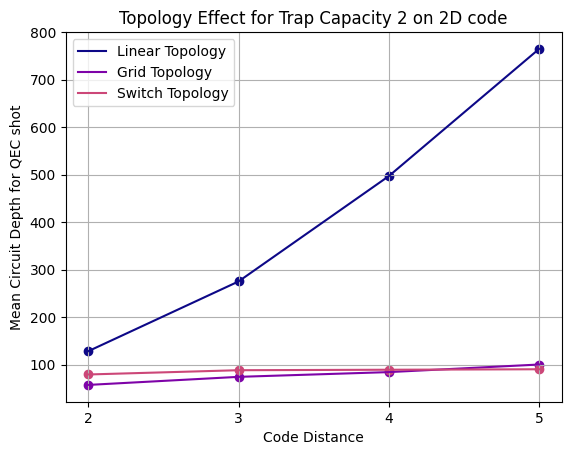

In [87]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()
_distances = [2,3,4,5]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [int(linear_data["Operations"][label][d][2]/linear_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [int(linear_data["Operations"][label][d][2]/linear_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [int(grid_data["Operations"][label][d][2]/grid_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [int(grid_data["Operations"][label][d][2]/grid_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [int(switch_data["Operations"][label][d][2]/switch_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [int(switch_data["Operations"][label][d][2]/switch_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 2 on 2D code')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Mean Circuit Depth for QEC shot')
ax1.grid(which='major')


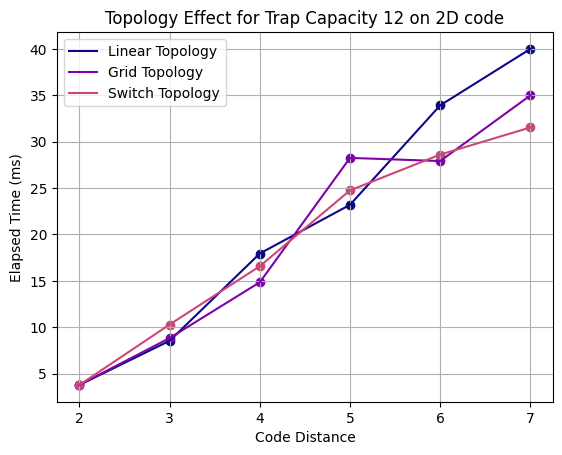

In [162]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()
_distances = [2,3,4,5,6,7]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [1e3*float(linear_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [1e3*float(linear_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [1e3*float(grid_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [1e3*float(grid_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [1e3*float(switch_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [1e3*float(switch_data["ElapsedTime"][label][d][12]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 12 on 2D code')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Elapsed Time (ms)')
ax1.grid(which='major')


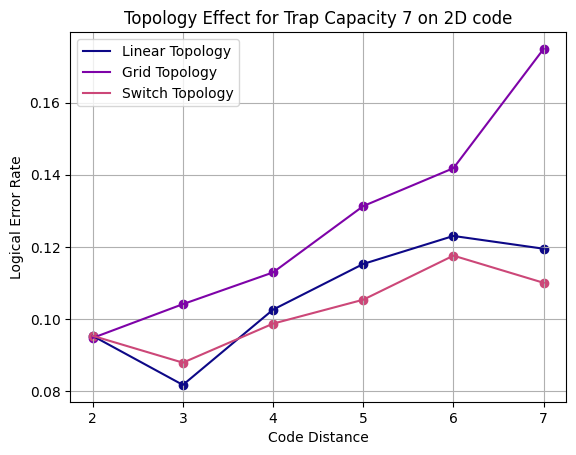

In [166]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()
_c = 7
_gi = gate_improvements.index(1)
_distances = [2,3,4,5,6,7]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [float(linear_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [float(linear_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [float(grid_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [float(grid_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [float(switch_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [float(switch_data["LogicalErrorRates"][label][d][_c][_gi]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 7 on 2D code')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Logical Error Rate')
ax1.grid(which='major')


In [221]:
data=linear_data

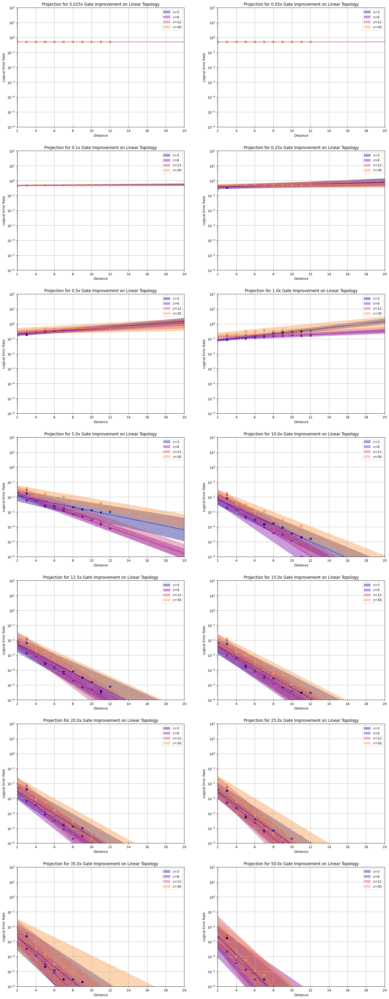

In [226]:
import scipy.stats

_capacities = [3,6,12,30]
_distances = distances
gi_offset = 0
_gate_improvements = gate_improvements[gi_offset:]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()

fig1.set_size_inches( 20,5*len(_gate_improvements)/1.4)
xs_projection = np.array([0, 50])

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(_capacities):
        if c in _capacities:
            if c==2:
                _distances=[2,3,4,5]
            else:
                _distances=distances
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][c][j+gi_offset] for d in _distances])
            ds = np.array(_distances)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0]
            ys = np.log(ys)

            def logPr(params, ys_given, eps = 1e-10):
                _alpha, _beta, _scale = params 
                _lik = stats.norm(loc=_alpha*(xs)+_beta, scale=_scale**2).pdf(ys_given)
                return np.log(_lik+eps)

            res = scipy.stats.linregress(xs, ys)
            alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr

            def readout_stat(rys_drawn, _xs):
                res = scipy.stats.linregress(xs, rys_drawn)
                _alpha_hat, _beta_hat = res.slope, res.intercept
                return np.exp(_alpha_hat*(_xs)+_beta_hat)
            
            def ry_star():
                return np.random.normal(loc=alpha_hat*xs+beta_hat, scale=np.sqrt(((ys-alpha_hat*xs-beta_hat)**2)))

            readouts = np.array([readout_stat(ry_star(), xs_projection) for _ in range(100)]).T
            los, his = np.quantile(readouts, [0.025,0.975], axis=1)
    
            ax.fill_between(xs_projection, los, his, color=colors[i], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)


            ax.plot(xs_projection,
                np.exp(alpha_hat*xs_projection+beta_hat),
                linestyle='--',
                # label=f"c={c}",
                c=colors[i])

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(_capacities):     
        if c in _capacities:
            if c==2:
                _distances=[2,3,4,5]
            else:
                _distances=distances
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][c][j+gi_offset] for d in _distances])  
            ds = np.array(_distances)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0] 
            ax.scatter(xs, ys, c=colors[i])
            
    ax.legend()
    ax.set_title(f'Projection for {improv}x Gate Improvement on Linear Topology')
    ax.set_xlabel('Distance')
    ax.set_ylabel('Logical Error Rate')

    ax.set_ylim(1e-6, 1e2)
    ax.set_xlim(2,20)
    ax.set_yscale('log')

    ax.grid(which='major')

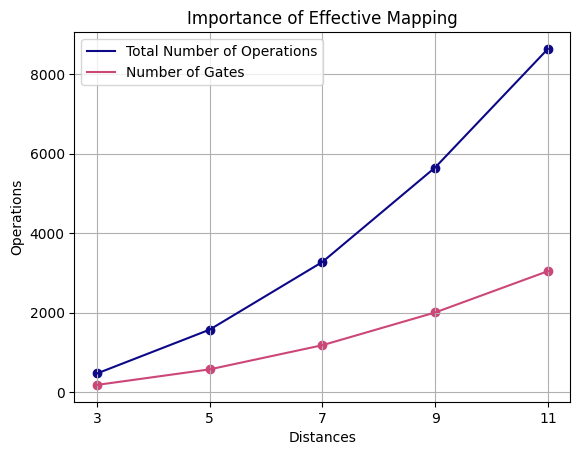

In [8]:
_distances = [3,5,7,9,11]

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 3))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [data["Operations"][label][d][0] for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Total Number of Operations")
ax1.plot(_distances, [data["QubitOperations"][label][d][0] for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Number of Gates")
ax1.scatter(_distances, [data["Operations"][label][d][0] for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.scatter(_distances, [data["QubitOperations"][label][d][0] for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Importance of Effective Mapping')
ax1.set_xlabel('Distances')
ax1.set_xticks(_distances)
ax1.set_ylabel('Operations')
ax1.grid(which='major')





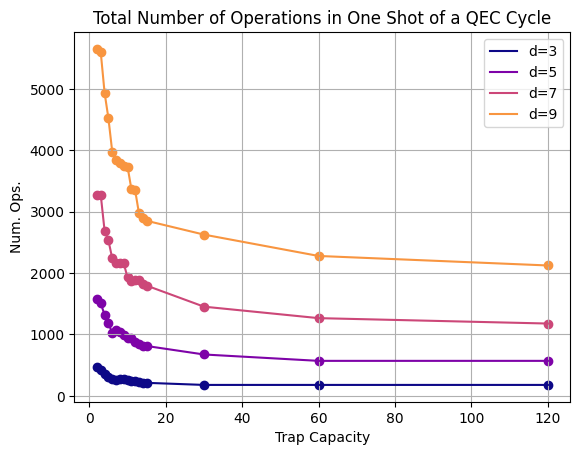

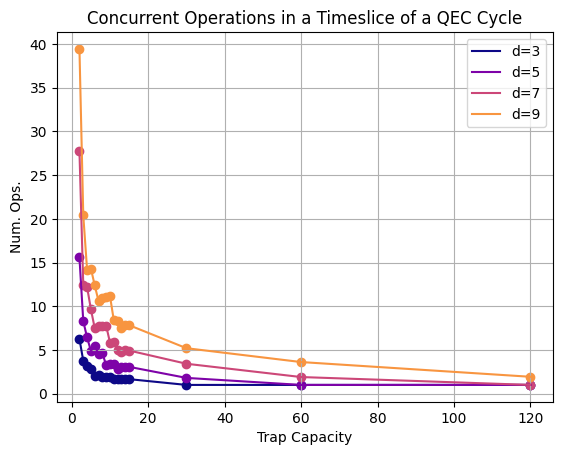

In [133]:
_distances = [3,5,7,9]
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
for j, d in enumerate(_distances):
    ax1.plot(_capacities, [data["Operations"][label][d][i] for i in range(len(_capacities))], c=colors[j], linestyle=("dashed" if iLabel==1 else "solid"), label=f"d={d}")
    ax1.scatter(_capacities, [data["Operations"][label][d][i] for i in range(len(_capacities))], c=colors[j], marker=("v" if iLabel==1 else "o"))

ax1.legend()
ax1.set_title('Total Number of Operations in One Shot of a QEC Cycle')
ax1.set_xlabel('Trap Capacity')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')



fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
for j, d in enumerate(_distances):
    ax1.plot(_capacities, [data["MeanConcurrency"][label][d][i] for i in range(len(_capacities))], c=colors[j], linestyle=("dashed" if iLabel==1 else "solid"), label=f"d={d}")
    ax1.scatter(_capacities, [data["MeanConcurrency"][label][d][i] for i in range(len(_capacities))], c=colors[j], marker=("v" if iLabel==1 else "o"))

ax1.legend()
ax1.set_title('Concurrent Operations in a Timeslice of a QEC Cycle')
ax1.set_xlabel('Trap Capacity')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')


In [204]:
import sklearn.linear_model
_model2 = sklearn.linear_model.LinearRegression(fit_intercept=True)

_distances = np.array([2,3,4,5,6])-2
_model2.fit(np.column_stack([ _distances, _distances**2]),  [max(data["ElapsedTime"][label][d+2][c] for c in capacities)*1e3 for d in _distances])
ps_hat = (
    # _model2.intercept_,
    _model2.coef_
    # _model2.coef_[1]
)
print(ps_hat)

[4.20371429 1.10357143]


In [203]:
data = grid_data
distances = [2,3,4,5,6,7,8,9,10,11,12]

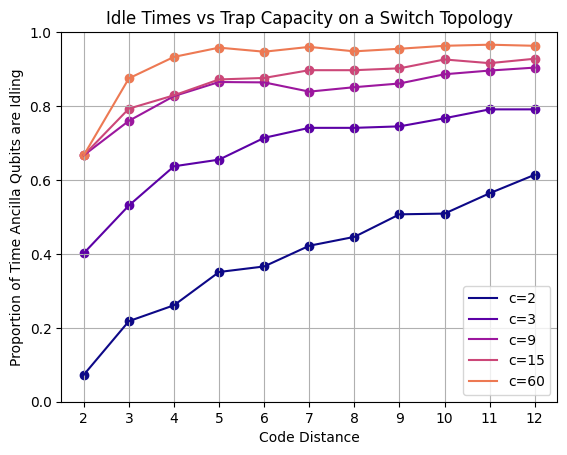

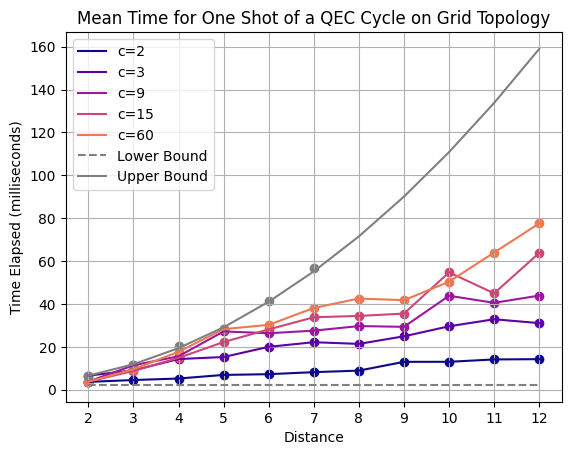

In [211]:
_capacities = [2,3,9,15,60,120]
_distances = distances
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig5, ax5 = plt.subplots()
for i, c in enumerate(_capacities[:-1]):
    if c in _capacities:
        ax5.plot(_distances, [1-round(data["MeanConcurrency"][label][d][c]/(d**2-1), 3) for d in _distances], c=colors[_capacities.index(c)], linestyle=("dashed" if iLabel==1 else "solid"), label=f"c={c}")
        ax5.scatter(_distances, [1-round(data["MeanConcurrency"][label][d][c]/(d**2-1), 3) for d in _distances], c=colors[_capacities.index(c)], marker=("v" if iLabel==1 else "o"))

ax5.legend()
ax5.set_title('Idle Times vs Trap Capacity on a Switch Topology')
ax5.set_xticks(_distances)
ax5.set_xlabel('Code Distance')
ax5.set_ylabel('Proportion of Time Ancilla Qubits are Idling')
ax5.grid(which='major')
ax5.set_yticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax5.set_ylim(0,1)

fig4, ax4 = plt.subplots()
for i, c in enumerate(_capacities[:-1]):
     if c in _capacities:
        ax4.plot(_distances, [data["ElapsedTime"][label][d][c]*1e3 for d in _distances], c=colors[_capacities.index(c)], linestyle=("dashed" if iLabel==1 else "solid"),label=f"c={c}")
        ax4.scatter(_distances, [data["ElapsedTime"][label][d][c]*1e3 for d in _distances], c=colors[_capacities.index(c)], marker=("v" if iLabel==1 else "o"))

ax4.plot(_distances, [2230/1e3 for d in _distances], c='grey', linestyle=("dashed"),label=f"Lower Bound")
ax4.plot(_distances, [max(data["ElapsedTime"][label][2][c] for c in capacities)*1e3+ps_hat[0]*(d-2)+ps_hat[1]*(d-2)**2 for d in _distances], c='grey', linestyle=("solid"),label=f"Upper Bound")
ax4.scatter([d for d in _distances if d<=7], [max(data["ElapsedTime"][label][d][c]*1e3 for c in capacities) for d in _distances if d<=7], marker=("v" if iLabel==1 else "o"), c='grey')
ax4.legend()
ax4.set_title('Mean Time for One Shot of a QEC Cycle on Grid Topology')
ax4.set_xlabel('Distance')
ax4.set_xticks(_distances)

ax4.set_ylabel('Time Elapsed (milliseconds)')
ax4.grid(which='major')

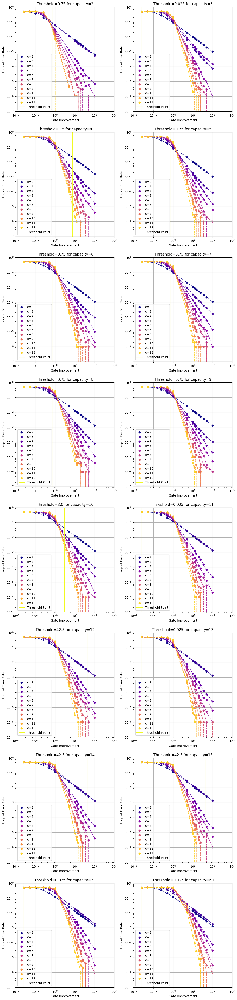

In [36]:

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2),2)
axs1=axs1.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_capacities)/1.4)

thresholds = []
thresholdIdxs = []
for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    threshold = gate_improvements[0]
    thresholdIdx = 0
    for idx, improv in enumerate(gate_improvements[1:]):
        isThreshold = True
        for d1, d2 in zip(distances[:-1], distances[1:]):
            if data["LogicalErrorRates"]["Forwarding"][d1][j][idx+1]<data["LogicalErrorRates"]["Forwarding"][d2][j][idx+1]:
                isThreshold = False 
        if isThreshold:
            threshold = (gate_improvements[idx-1]+gate_improvements[idx])/2
            thresholdIdx = idx
            break
    thresholds.append(threshold)
    thresholdIdxs.append(thresholdIdx)

    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
    
    ax1.vlines([threshold], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



In [44]:
print(thresholds)
print(thresholdIdxs)

[7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]


In [45]:
print(gate_improvements)

[0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]


In [38]:
# thresholds[capacities.index(120)] = 7.5
thresholds[_capacities.index(60)] = 7.5
thresholds[_capacities.index(30)] = 7.5
thresholds[_capacities.index(15)] = 7.5
thresholds[_capacities.index(14)] = 7.5
thresholds[_capacities.index(13)] = 7.5

for i, t in enumerate(thresholds):
    for j, g in enumerate(gate_improvements):
        if g>t:
            break 
    thresholdIdxs[i] = j

In [88]:
for i in range(len(thresholds)):
    thresholds[i] = 2.0

for i, t in enumerate(thresholds):
    for j, g in enumerate(gate_improvements):
        if g>t:
            break 
    thresholdIdxs[i] = j

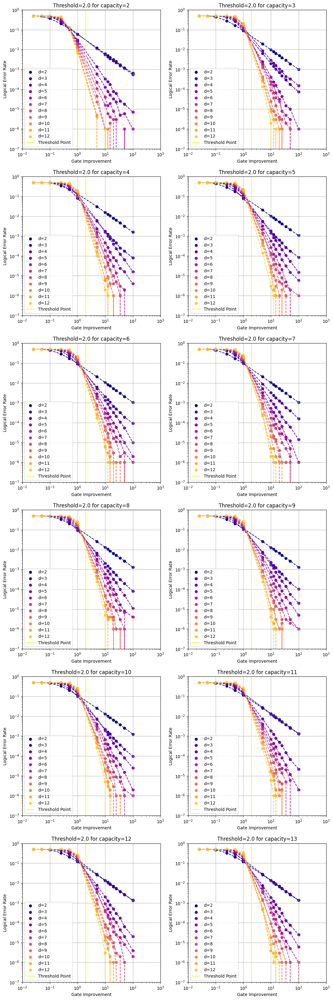

In [89]:
# _capacities = capacities[:-1]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2),2)
axs1=axs1.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_capacities)/1.4)


for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    threshold = thresholds[j]
    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
    
    ax1.vlines([threshold], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



In [64]:

def findMaxGi(_j, _d):
    return min(
        [
            u
            for u in range(len(gate_improvements))
            if data["LogicalErrorRates"]["Forwarding"][_d][_j][u] == 0
        ],
        default=len(gate_improvements),
    )


cs = np.concatenate(
    [
        np.concatenate(
            [
                [c] * len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                for d in distances
            ]
        )
        for j, c in enumerate(_capacities)
    ]
)
ds = np.concatenate(
    [
        np.concatenate(
            [
                [d] * len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                for d in distances
            ]
        )
        for j in range(len(_capacities))
    ]
)
xs = np.concatenate(
    [
        np.concatenate(
            [gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)] for d in distances]
        )
        for j in range(len(_capacities))
    ]
)
ys = np.concatenate(
    [
        np.concatenate(
            [
                [
                    data["LogicalErrorRates"]["Forwarding"][d][j][k + thresholdIdxs[j]]
                    for k in range(
                        len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                    )
                ]
                for d in distances
            ]
        )
        for j in range(len(_capacities))
    ]
)

xs = np.log(xs)
ys = np.log(ys)


import sklearn.linear_model


_model2 = sklearn.linear_model.LinearRegression()


def _model2paramsfunc(_cs, _ds, _xs):
    _cs, _ds, _xs = np.array(_cs), np.array(_ds), np.array(_xs)
    return np.column_stack([ np.where(_cs==c, _xs, 0) for c in _capacities[:-1]]+[np.where(_ds==d,_xs,0) for d in distances]+[np.where(_cs==c, 1, 0) for c in _capacities[:-1]]+[np.where(_ds==d,1,0) for d in distances[:-1]])


def _model2rootfunc(_cs, _ds, _desired_y):
    _cs, _ds = np.array(_cs, dtype=int), np.array(_ds, dtype=int)
    _numer_inter = np.zeros_like(_cs, dtype=float)+p0_hat
    _denom_slope = np.zeros_like(_cs, dtype=float)
    _i = 0
    for _c in _capacities[:-1]:
        _denom_slope+=ps_hat[_i]*np.where(_cs==_c, 1,0)
        _i+=1
    for _d in distances:
        _denom_slope+=ps_hat[_i]*np.where(_ds==_d,1,0)
        _i+=1
    for _c in _capacities[:-1]:
        _numer_inter+=ps_hat[_i]*np.where(_cs==_c, 1,0)
        _i+=1
    for _d in distances[:-1]:
        _numer_inter+=ps_hat[_i]*np.where(_ds==_d,1,0)
        _i+=1

    return np.exp(
        np.divide(
            _desired_y - _numer_inter,
            _denom_slope,
        )
    )


_model2.fit(_model2paramsfunc(cs, ds, xs), ys)
p0_hat, ( ps_hat) = (
    _model2.intercept_,
    _model2.coef_,
)

print( p0_hat,  ps_hat)
ps_hat = ps_hat[2:]



_model2_errors_squared = (
    ys
    - _model2.predict(
        _model2paramsfunc(cs, ds, xs)
    )
) ** 2

print(np.sqrt(np.mean(_model2_errors_squared)))

x_bins = 100
y_bins = 100
_range = [[min(_capacities), max(_capacities)], [min(distances), max(distances)]]
counts, xedges, yedges = np.histogram2d(
    cs, ds, bins=[x_bins, y_bins], range=_range
)
values, _, _ = np.histogram2d(
    cs,
    ds,
    bins=[x_bins, y_bins],
    weights=_model2_errors_squared,
    range=_range,
)
counts = counts.T
values = values.T

with np.errstate(divide="ignore", invalid="ignore"):
    values = values / counts
    # scaled_to_error_values = (values/max(values.flatten()))*max(_model2_errors_squared)
    scaled_to_error_values = values
    scaled_to_error_values[counts == 0] = np.nan

x_centers = (xedges[:-1] + xedges[1:]) / 2
y_centers = (yedges[:-1] + yedges[1:]) / 2
X, Y = np.meshgrid(x_centers, y_centers)

points = np.column_stack([X.ravel(), Y.ravel()])
scaled_to_error_values_flat = scaled_to_error_values.ravel()

empty_bins = np.isnan(scaled_to_error_values_flat)


from scipy.interpolate import griddata
from scipy.spatial import cKDTree

if np.any(empty_bins):
    interpolated_values_flat = griddata(
        points[~empty_bins],
        scaled_to_error_values_flat[~empty_bins],
        points,
        method="cubic",
    )

empty_bins = np.isnan(interpolated_values_flat)
if np.any(np.isnan(interpolated_values_flat)):
    tree = cKDTree(points[~empty_bins])
    dist, idx = tree.query(points[np.isnan(interpolated_values_flat)])
    interpolated_values_flat[np.isnan(interpolated_values_flat)] = (
        interpolated_values_flat[~empty_bins][idx]
    )

interpolated_values = interpolated_values_flat.reshape(scaled_to_error_values.shape)
def _model2scalefunc(_cs, _ds):
    tree = cKDTree(points)
    _, idx = tree.query(list(zip(_cs, _ds)))
    return np.sqrt(interpolated_values_flat[idx])


print(np.mean(_model2scalefunc(cs, ds)))

3.282831508345744 [ 1.0994345   0.4013951   0.41489976  0.39400164  0.31177664  0.36276722
  0.24202385  0.42152035  0.26195767  0.44045985  0.47055134  0.41399874
  0.33455677  0.36460642  0.17912624 -1.37344755 -1.60258184 -2.31796496
 -2.77204453 -3.11736819 -3.332499   -3.78872318 -4.30220289 -4.35723037
 -4.90061131 -5.43897785 -6.99578718 -3.88420243 -4.05130661 -3.88346154
 -3.65492465 -3.71127064 -3.38264143 -3.76162435 -3.32289365 -3.48998345
 -3.46759096 -3.28895514 -2.97441031 -3.04636087 -1.69377678 -2.02779344
 -2.2909035  -1.75390853 -1.52277289 -1.44205124 -1.47277062 -1.37195893
 -0.70376299 -1.19118543 -0.55918813]
0.5876094648875967
nan


/var/folders/wb/b8rfjwj12jn7gld5g0b3c2x80000gn/T/ipykernel_66233/3412999957.py:175: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(interpolated_values_flat[idx])


/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/CS Year 3/Summer Project/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10917: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/CS Year 3/Summer Project/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10931: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/CS Year 3/Summer Project/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10934: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


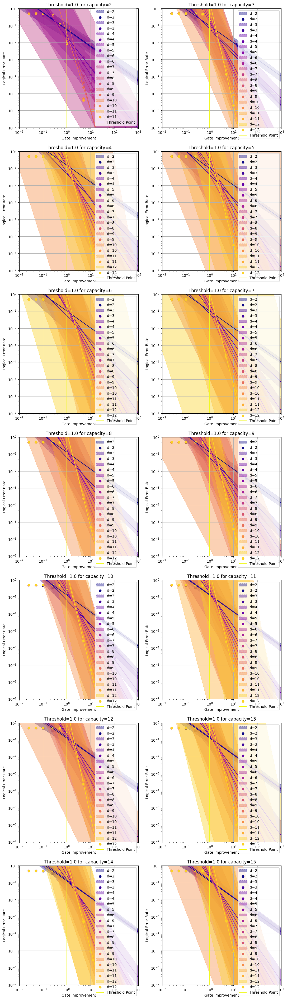

In [65]:

from scipy import stats
from scipy.optimize import minimize

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2),2)
axs1=axs1.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_capacities)/1.4)


fittings_dict = {c: {d: None for d in distances} for c in _capacities}
for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    for i,d in enumerate(distances):
        xs_for_cd = np.log(gate_improvements[thresholdIdxs[j]:findMaxGi(j,d)])
        if len(xs_for_cd)==0:
            continue
        ys = np.log(data["LogicalErrorRates"]["Forwarding"][d][j][thresholdIdxs[j]:findMaxGi(j,d)])
  
        res = stats.linregress(xs_for_cd, ys)
        alpha_hat, beta_hat, stderr_s_hat, stderr_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
        fittings_dict[c][d] = alpha_hat, beta_hat, (stderr_s_hat), (stderr_i_hat), np.sqrt(np.mean((ys-xs_for_cd*alpha_hat-beta_hat)**2))

        def readout_stat(_rys_drawn, _xs_proj):
            _res = stats.linregress(xs_for_cd, _rys_drawn)
            _alpha_hat, _beta_hat = _res.slope, _res.intercept
            return np.exp(_alpha_hat*(_xs_proj)+_beta_hat)
        
        def ry_star():
            return np.random.normal(loc=alpha_hat*xs_for_cd+beta_hat, scale=np.sqrt(stderr_s_hat*xs_for_cd+stderr_i_hat))

        xs_projection = np.log(np.array([1e-2, 1000]))
        readouts = np.array([readout_stat(ry_star(), xs_projection) for _ in range(10)]).T
        los, his = np.quantile(readouts, [0.025,0.975], axis=1)
  
        ax1.fill_between(np.exp(xs_projection), los, his, color=colors[i], interpolate=True,label=f"d={d}", linestyle="dashed", alpha=0.4)
        ax1.plot(np.exp(xs_projection), np.exp(alpha_hat*xs_projection+beta_hat), color=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
    
    ax1.vlines([thresholds[j]], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



In [72]:

def rootfunc(_cs,_ds, _desired_y):
    _rs = []
    for c, d in zip(_cs, _ds):
        if not fittings_dict[c][d]:
            _rs.append(np.nan)
        else:
            _a_hat, _b_hat, _,_,_ = fittings_dict[c][d]
            _rs.append(np.exp((_desired_y-_b_hat)/_a_hat))
    return _rs

def _errorsSquared(_cs,_ds):
    _rs = []
    for c, d in zip(_cs, _ds):
        if not fittings_dict[c][d]:
            _rs.append(1.0)
        else:
            _, _, _, _, _mse = fittings_dict[c][d]
            _rs.append(_mse)
    return _rs

def _errorsFromFitting(_cs,_ds, _xs):
    _rs = []
    for c, d, x in zip(_cs, _ds,_xs):
        if not fittings_dict[c][d]:
            _rs.append(np.nan)
        else:
            _,_, _ss,_si,_ = fittings_dict[c][d]
            _rs.append(np.sqrt(_ss*x+_si))
    return _rs

def _predictFromFitting(_cs,_ds, _xs):
    _rs = []
    for c, d, x in zip(_cs, _ds,_xs):
        if not fittings_dict[c][d]:
            _rs.append(np.nan)
        else:
            _a_hat, _b_hat, _,_,_ = fittings_dict[c][d]
            _rs.append(_a_hat*x+_b_hat)
    return _rs

In [74]:
print(fittings_dict)

{2: {2: (-0.988635221344179, -2.8192038356333526, 0.011799504045587694, 0.03733250272947936, 0.02647772735489996), 3: (-0.9978936317419286, -2.9122459429030596, 0.007625415200642222, 0.024126084680469333, 0.017111199239416838), 4: (-1.8011431583370192, -3.8559958826630973, 0.07543373902855513, 0.2386651385768567, 0.16927101068330247), 5: (-2.1169599841796503, -4.076875552876304, 0.10895972331308375, 0.34473814766054556, 0.24450229733404708), 6: (-2.5596348412428394, -4.271209128699926, 0.22702489008271487, 0.5930276821467402, 0.2357056365104639), 7: (-2.7272544550343905, -4.848483216480364, 0.2632092532198263, 0.6509249598751953, 0.2134500066734276), 8: (-5.491853096329673, -1.1700514854423751, 0.0, 0.0, 0.0), 9: (-4.523561956057011, -3.399624230712412, 0.0, 0.0, 0.0), 10: (nan, nan, nan, nan, nan), 11: (nan, nan, nan, nan, nan), 12: None}, 3: {2: (-0.9872425211044903, -2.356747240846207, 0.007070894319604347, 0.022371633626855687, 0.015866871287668474), 3: (-1.4896690039245128, -2.784

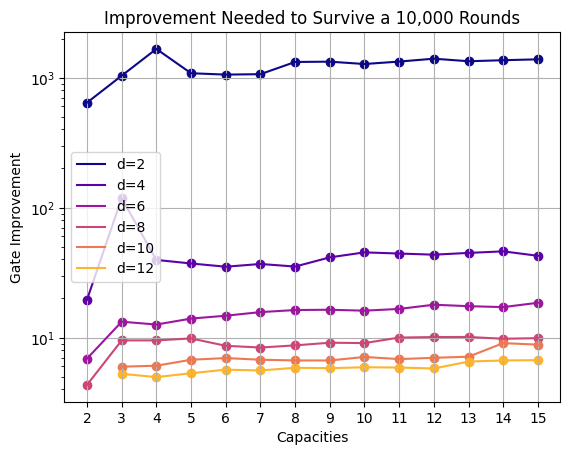

In [77]:
_distances = [2,4,6,8,10,12]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

desired_y = np.log(1e-4)

fig1, ax1 = plt.subplots()
for i, d in enumerate(_distances):
    ax1.plot([k for k in range(len(_capacities))], rootfunc(_capacities, [d]*len(_capacities), desired_y) , color=colors[i],label=f"d={d}")
    ax1.scatter([k for k in range(len(_capacities))], rootfunc(_capacities, [d]*len(_capacities), desired_y), color=colors[i])
ax1.legend()
ax1.set_title(f'Improvement Needed to Survive a 10,000 Rounds')
ax1.set_xlabel('Capacities')
ax1.set_ylabel('Gate Improvement')

ax1.set_yticks(gate_improvements)
ax1.set_xticks([k for k in range(len(_capacities))])
ax1.set_xticklabels(_capacities)
ax1.set_yscale('log')

ax1.grid(which='major')

In [78]:
cs = np.concatenate(
    [
        np.concatenate(
            [
                [c] * len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                for d in distances
            ]
        )
        for j, c in enumerate(_capacities)
    ]
)
ds = np.concatenate(
    [
        np.concatenate(
            [
                [d] * len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                for d in distances
            ]
        )
        for j in range(len(_capacities))
    ]
)


Text(0.5, 1.0, 'Squared Error for Gate Improvement')

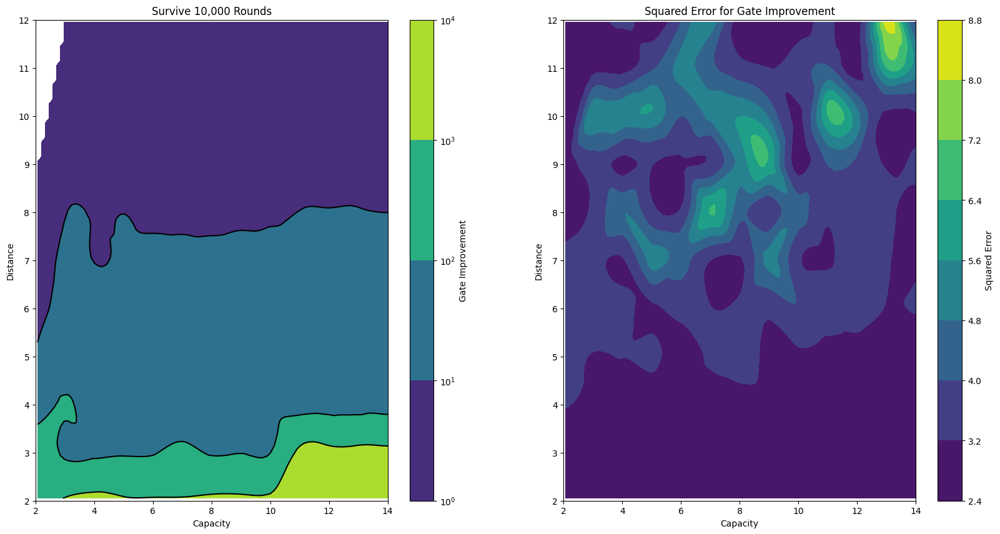

In [79]:

capacities_proj = np.linspace(2,60,100)
distances_proj = np.linspace(3,9,100)
cs_proj = np.array([capacities_proj for _ in range(len(distances_proj))])
ds_proj = np.array([[d]*len(capacities_proj) for d in distances_proj])
desired_y = np.log(1e-4)
gate_improv_proj = np.log(rootfunc(cs, ds, desired_y))

_range = [[min(_capacities), max(_capacities)], [min(distances), max(distances)]]
_counts, cedges, dedges = np.histogram2d(
    cs, ds, bins=[100, 100], range=_range
)
_values, _, _ = np.histogram2d(
    cs,
    ds,
    bins=[100, 100],
    weights=gate_improv_proj,
    range=_range,
)
_counts = _counts.T
_values = _values.T

with np.errstate(divide="ignore", invalid="ignore"):
    scaled_to_improv_values = _values / _counts
    scaled_to_improv_values[_counts == 0] = np.nan

c_centers = (cedges[:-1] + cedges[1:]) / 2
d_centers = (dedges[:-1] + dedges[1:]) / 2
C, D = np.meshgrid(c_centers, d_centers)

_points = np.column_stack([C.ravel(), D.ravel()])
scaled_to_improv_values_flat = scaled_to_improv_values.ravel()

from scipy.interpolate import griddata
_empty_bins = np.isnan(scaled_to_improv_values_flat)
if np.any(_empty_bins):
    _interpolated_improv_values_flat = griddata(
        _points[~_empty_bins],
        scaled_to_improv_values_flat[~_empty_bins],
        _points,
        method="cubic",
    )

_interpolated_improv_values = _interpolated_improv_values_flat.reshape(scaled_to_improv_values.shape)
fig, axs = plt.subplots(1,2)
fig.set_size_inches(20,10)
ax=axs[0]
contour_filled = ax.contourf(C, D, np.exp(_interpolated_improv_values), cmap='viridis', norm=mplcolors.LogNorm())
ax.contour(C, D,np.exp( _interpolated_improv_values),  colors='black', norm=mplcolors.LogNorm())
cbar = fig.colorbar(contour_filled, ax=ax)
cbar.set_label('Gate Improvement')

ax.set_xlabel('Capacity')
ax.set_ylabel('Distance')

ax.set_yticks(distances)
ax.set_xlim(min(_capacities),max(_capacities[:-1]))
ax.set_ylim(min(distances),max(distances))

ax.set_title('Survive 10,000 Rounds')



x_bins = 100
y_bins = 100
_range = [[min(_capacities), max(_capacities)], [min(distances), max(distances)]]
counts, xedges, yedges = np.histogram2d(
    cs, ds, bins=[x_bins, y_bins], range=_range
)
values, _, _ = np.histogram2d(
    cs,
    ds,
    bins=[x_bins, y_bins],
    weights=np.exp(_errorsSquared(cs, ds)),
    range=_range,
)
counts = counts.T
values = values.T

with np.errstate(divide="ignore", invalid="ignore"):
    values = values / counts
    scaled_to_error_values = values
    scaled_to_error_values[counts == 0] = np.nan

x_centers = (xedges[:-1] + xedges[1:]) / 2
y_centers = (yedges[:-1] + yedges[1:]) / 2
X, Y = np.meshgrid(x_centers, y_centers)

points = np.column_stack([X.ravel(), Y.ravel()])
scaled_to_error_values_flat = scaled_to_error_values.ravel()

empty_bins = np.isnan(scaled_to_error_values_flat)


from scipy.interpolate import griddata
from scipy.spatial import cKDTree

if np.any(empty_bins):
    interpolated_values_flat = griddata(
        points[~empty_bins],
        scaled_to_error_values_flat[~empty_bins],
        points,
        method="cubic",
    )

empty_bins = np.isnan(interpolated_values_flat)
if np.any(np.isnan(interpolated_values_flat)):
    tree = cKDTree(points[~empty_bins])
    dist, idx = tree.query(points[np.isnan(interpolated_values_flat)])
    interpolated_values_flat[np.isnan(interpolated_values_flat)] = (
        interpolated_values_flat[~empty_bins][idx]
    )

interpolated_values = interpolated_values_flat.reshape(scaled_to_error_values.shape)




ax=axs[1]
contour_filled = ax.contourf( X, Y, np.exp(interpolated_values), cmap='viridis')
fig.colorbar(contour_filled, ax=ax, label='Squared Error')
ax.set_xlabel('Capacity')
ax.set_ylabel('Distance')

ax.set_yticks(distances)
ax.set_xlim(min(_capacities),max(_capacities[:-1]))
ax.set_ylim(min(distances),max(distances))
ax.set_title('Squared Error for Gate Improvement')


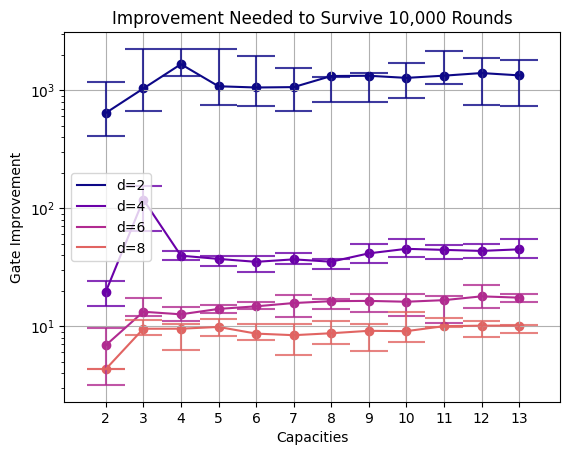

In [83]:
_capacities = _capacities
_distances = [2,4,6,8]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+2))
colors = [mplcolors.to_hex(c) for c in colors]
desired_y = np.log(1e-4)
fig1, ax1 = plt.subplots()
for j, d in enumerate(_distances):
    los, his = [], []
    for i,c in enumerate(_capacities):
        xs_for_cd = np.log(gate_improvements[thresholdIdxs[i]:findMaxGi(i,d)])
        if len(xs_for_cd)==0:
            los.append(0)
            his.append(0)
            continue
        def readout_stat(rys_drawn):
            _res = stats.linregress(xs_for_cd, rys_drawn)
            _alpha_hat, _beta_hat = _res.slope, _res.intercept
            return np.exp((desired_y-_beta_hat)/_alpha_hat)
        
        def ry_star():
            _cs, _ds = [c]*len(xs_for_cd), [d]*len(xs_for_cd)
            return np.random.normal(loc=_predictFromFitting(_cs, _ds, xs_for_cd), scale=_errorsFromFitting(_cs, _ds, xs_for_cd))

        readouts = np.array([readout_stat(ry_star()) for _ in range(10)])
        lo, hi = np.quantile(readouts, [0.025,0.975])
        los.append(lo)
        his.append(hi)   
    ax1.plot([k for k in range(len(_capacities))], rootfunc(_capacities, [d]*len(_capacities), desired_y) , color=colors[j],label=f"d={d}")
    ax1.scatter([k for k in range(len(_capacities))], rootfunc(_capacities, [d]*len(_capacities), desired_y), color=colors[j])
    ax1.hlines(los+his, xmin=[k-1/2 for k in range(len(_capacities))]*2, xmax=[k+1/2 for k in range(len(_capacities))]*2, colors=[colors[j]]*(len(los)+len(his)), alpha=0.8)
    ax1.vlines([k for k in range(len(_capacities))], ymin=los, ymax=his, colors=[colors[j]]*(len(los)+len(his)), alpha=0.8)
ax1.legend()
ax1.set_title(f'Improvement Needed to Survive 10,000 Rounds')
ax1.set_xlabel('Capacities')
ax1.set_ylabel('Gate Improvement')

ax1.set_xticks([k for k in range(len(_capacities))])
ax1.set_xticklabels(_capacities)
ax1.set_yscale('log')
ax1.grid(which='major')

In [117]:
data = linear_data

NameError: name 'fig4' is not defined

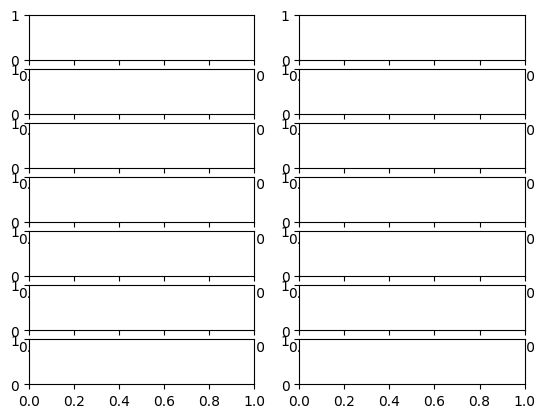

In [119]:
import scipy.stats

_capacities = [2,3,6,12,30]
gi_offset = 0
_gate_improvements = gate_improvements[gi_offset:]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_gate_improvements)/1.4)
xs_projection = np.array([0, 50])

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(_capacities):
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
            ds = np.array(distances)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0]
            ys = np.log(ys)

            def logPr(params, ys_given, eps = 1e-10):
                _alpha, _beta, _scale = params 
                _lik = stats.norm(loc=_alpha*(xs)+_beta, scale=_scale**2).pdf(ys_given)
                return np.log(_lik+eps)

            res = scipy.stats.linregress(xs, ys)
            alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr

            def readout_stat(rys_drawn, _xs):
                res = scipy.stats.linregress(xs, rys_drawn)
                _alpha_hat, _beta_hat = res.slope, res.intercept
                return np.exp(_alpha_hat*(_xs)+_beta_hat)
            
            def ry_star():
                return np.random.normal(loc=alpha_hat*xs+beta_hat, scale=np.sqrt(((ys-alpha_hat*xs-beta_hat)**2)))

            readouts = np.array([readout_stat(ry_star(), xs_projection) for _ in range(100)]).T
            los, his = np.quantile(readouts, [0.025,0.975], axis=1)
    
            ax.fill_between(xs_projection, los, his, color=colors[i], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)


            ax.plot(xs_projection,
                np.exp(alpha_hat*xs_projection+beta_hat),
                linestyle='--',
                label=f"c={c}",
                c=colors[i])

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(_capacities):     
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
            ds = np.array(distances)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0] 
            ax.scatter(xs, ys, c=colors[i])
            
    ax.legend()
    ax.set_title(f'Projection for {improv}x Gate Improvement')
    ax.set_xlabel('Distance')
    ax.set_ylabel('Logical Error Rate')

    ax.set_ylim(1e-6, 1e2)
    ax.set_xlim(*xs_projection)
    ax.set_yscale('log')

    ax.grid(which='major')